# 07 — GradCAM: Qualitative Analysis

Generate GradCAM heatmaps for interpretability analysis of melanoma classification models.
Compares ResNet18 checkpoints on 8 test images (4 ISIC 2018 + 4 ISIC 2020, balanced MEL/BEN).

**5 figure groups:**
| Figure | Comparison | Layout |
|--------|-----------|--------|
| 1 | Baseline Full vs SSL 1% vs DANN 1% | 8×4 full + 4×4 compact |
| 2 | Baseline 1% vs SSL 1% vs DANN 1% | 8×4 full + 4×4 compact |
| 3 | SSL label budget progression (1% → 100%) | 4×7 compact |
| 4 | All methods at 100% labels (5 methods) | 4×6 compact |
| 5 | Mean Teacher collapse: 1% vs 100% (+SSL ref) | 4×4 compact |

**Output:** `results/figures/gradcam/`

## 1. Setup and checkpoint verification

In [1]:
import os, sys, json
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from PIL import Image

root = Path.cwd()
if root.name == 'notebooks':
    root = root.parent
os.chdir(root)
sys.path.insert(0, str(root))

from src.models import build_backbone
from src.augmentations import get_val_transforms, IMAGENET_MEAN, IMAGENET_STD
from src.reporting import get_latest_run
from src.utils import get_device

# ── Verify grad-cam is available ──
try:
    import subprocess
    result = subprocess.run(['pip', 'show', 'grad-cam'], capture_output=True, text=True)
    if 'Version' not in result.stdout:
        subprocess.run(['pip', 'install', 'grad-cam', '--break-system-packages'], check=True)
except Exception as e:
    print(f'Warning: grad-cam setup issue: {e}')

from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

print('All imports successful.')


All imports successful.


In [2]:
# ── Device and output directory ──
device = get_device('auto')
print(f'Device: {device}')

FIG_DIR = Path('results/figures/gradcam')
FIG_DIR.mkdir(parents=True, exist_ok=True)
print(f'Output directory: {FIG_DIR}')

# ── Verify required runs exist ──
REQUIRED_RUNS = [
    'baseline_resnet18_full',
    'baseline_resnet18_0.01',
    'simclr_ft_0.01',
    'dann_ft_0.01',
]

print('\n=== Checkpoint verification ===')
for exp_name in REQUIRED_RUNS:
    rd = get_latest_run(exp_name)
    if rd is None:
        print(f'  WARNING: Run \'{exp_name}\' not found in results/runs/')
        print(f'    → Run the corresponding experiment notebook first')
    else:
        ckpt = rd / 'checkpoints/best.pt'
        if ckpt.exists():
            print(f'  ✓ {exp_name}: {rd}')
        else:
            print(f'  ✗ {exp_name}: {rd} (no best.pt — trying last.pt)')
            ckpt_last = rd / 'checkpoints/last.pt'
            if ckpt_last.exists():
                print(f'    → Using last.pt instead')
            else:
                print(f'    → No checkpoint found!')


Device: mps
Output directory: results/figures/gradcam

=== Checkpoint verification ===
  ✓ baseline_resnet18_full: results/runs/baseline_resnet18_full/20260530_140056
  ✓ baseline_resnet18_0.01: results/runs/baseline_resnet18_0.01/20260530_184400
  ✓ simclr_ft_0.01: results/runs/simclr_ft_0.01/20260601_143001
  ✓ dann_ft_0.01: results/runs/dann_ft_0.01/20260605_004109


In [3]:
# ── Load model function (same pattern as evaluate_on_csv in reporting.py) ──
def load_model(exp_name: str, device) -> torch.nn.Module:
    """Load best checkpoint for given experiment name.
    
    Replicates the loading pattern from `reporting.py::evaluate_on_csv`:
    - build_backbone(arch='resnet18', pretrained=False, num_classes=1)
    - torch.load(ckpt_path, map_location=device)
    - model.load_state_dict(ckpt['model'])
    """
    run_dir = get_latest_run(exp_name)
    if run_dir is None:
        raise FileNotFoundError(f"No run found for '{exp_name}'")
    
    ckpt_path = run_dir / 'checkpoints/best.pt'
    if not ckpt_path.exists():
        ckpt_path = run_dir / 'checkpoints/last.pt'
    if not ckpt_path.exists():
        raise FileNotFoundError(f"No checkpoint found in {run_dir}")
    
    model = build_backbone(arch='resnet18', pretrained=False, num_classes=1)
    ckpt = torch.load(ckpt_path, map_location=device)
    
    # Same pattern as evaluate_on_csv: ckpt.get('model', ckpt)
    state = ckpt.get('model', ckpt)
    model.load_state_dict(state)
    model.eval()
    model.to(device)
    
    print(f"  ✓ Loaded: {ckpt_path}")
    return model


In [4]:
# ── Load all 4 checkpoints ──
MODEL_SPECS = [
    ('baseline_resnet18_full', 'Baseline Full'),
    ('baseline_resnet18_0.01',  'Baseline 1%'),
    ('simclr_ft_0.01',         'SSL 1%'),
    ('dann_ft_0.01',           'DANN 1%'),
]

models = {}
for exp_name, label in MODEL_SPECS:
    try:
        models[label] = load_model(exp_name, device)
    except FileNotFoundError as e:
        print(f"  ✗ SKIPPED: {label} — {e}")

print(f'\nLoaded {len(models)}/{len(MODEL_SPECS)} models: {list(models.keys())}')


  ✓ Loaded: results/runs/baseline_resnet18_full/20260530_140056/checkpoints/best.pt
  ✓ Loaded: results/runs/baseline_resnet18_0.01/20260530_184400/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_0.01/20260601_143001/checkpoints/best.pt
  ✓ Loaded: results/runs/dann_ft_0.01/20260605_004109/checkpoints/best.pt

Loaded 4/4 models: ['Baseline Full', 'Baseline 1%', 'SSL 1%', 'DANN 1%']


## 2. Image selection

In [5]:
# ── Load test CSVs ──
df_2018 = pd.read_csv('data/processed/isic2018/test.csv')
df_2020 = pd.read_csv('data/processed/isic2020/test.csv')
print(f'ISIC 2018 test: {len(df_2018)} images ({df_2018.target.sum()} malignant)')
print(f'ISIC 2020 test: {len(df_2020)} images ({df_2020.target.sum()} malignant)')


ISIC 2018 test: 1002 images (112 malignant)
ISIC 2020 test: 3313 images (58 malignant)


In [6]:
# ── Select 8 images: 2 MEL + 2 BEN from each dataset ──
np.random.seed(42)

def sample_images(df, n_malignant=2, n_benign=2, seed=42):
    mal = df[df['target'] == 1].sample(n=n_malignant, random_state=seed)
    ben = df[df['target'] == 0].sample(n=n_benign, random_state=seed)
    return pd.concat([mal, ben]).reset_index(drop=True)

sel_2018 = sample_images(df_2018, n_malignant=2, n_benign=2, seed=42)
sel_2020 = sample_images(df_2020, n_malignant=2, n_benign=2, seed=42)
selected = pd.concat([sel_2018, sel_2020]).reset_index(drop=True)

print(f'Selected {len(selected)} images:')
print(selected[['image_id', 'target', 'source']].to_string(index=False))


Selected 8 images:
    image_id  target   source
ISIC_0025409       1 isic2018
ISIC_0027089       1 isic2018
ISIC_0027979       0 isic2018
ISIC_0027309       0 isic2018
ISIC_9022005       1 isic2020
ISIC_8040024       1 isic2020
ISIC_8501844       0 isic2020
ISIC_6003494       0 isic2020


In [7]:
# ── Image loading helper ──
from torchvision.transforms.functional import resize as tv_resize, to_tensor

val_tf = get_val_transforms(img_size=224)

def load_image_pair(filepath: str):
    """Returns (tensor_for_model [1,3,224,224], float_rgb [224,224,3])."""
    img_pil = Image.open(filepath).convert('RGB')
    
    # For model input: full val transforms (resize + ImageNet normalization)
    img_tensor = val_tf(img_pil).unsqueeze(0)  # [1, 3, 224, 224]
    
    # For show_cam_on_image: resize only, [0,1] range, HWC format
    img_resized = tv_resize(img_pil, [224, 224])
    img_float = np.array(img_resized).astype(np.float32) / 255.0  # [224, 224, 3]
    
    return img_tensor, img_float

# ── Preload all images ──
images_data = []
for _, row in selected.iterrows():
    tensor, rgb_float = load_image_pair(row['filepath'])
    images_data.append({
        'tensor': tensor,
        'rgb_float': rgb_float,
        'target': int(row['target']),
        'source': row['source'],
        'image_id': row['image_id'],
    })
print(f'Loaded {len(images_data)} image pairs.')


Loaded 8 image pairs.


## 3. GradCAM generation

In [8]:
# ── GradCAM generation function ──
def get_gradcam(model, img_tensor, img_float, device, use_positive_class=True):
    """
    Generate GradCAM heatmap for a single image.
    
    Args:
        model: ResNet18 with num_classes=1
        img_tensor: [1, 3, 224, 224] normalized
        img_float: [224, 224, 3] float [0,1]
        use_positive_class: if True, activate w.r.t. malignant class (1)
    
    Returns:
        cam_image: [224, 224, 3] float [0,1] — heatmap overlay
        prob: float — predicted probability of malignant
        grayscale_cam: [224, 224] — raw heatmap
    """
    target_layers = [model.layer4[-1]]
    targets = [BinaryClassifierOutputTarget(1)] if use_positive_class else None
    
    img_tensor = img_tensor.to(device)
    
    # Try GradCAM first, fallback to EigenCAM
    cam_image = None
    grayscale_cam = None
    
    try:
        with GradCAM(model=model, target_layers=target_layers) as cam:
            grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
            grayscale_cam = grayscale_cam[0]  # [224, 224]
    except Exception as e:
        print(f'    GradCAM failed ({e}), falling back to EigenCAM...')
        with EigenCAM(model=model, target_layers=target_layers) as cam:
            grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
            grayscale_cam = grayscale_cam[0]
    
    # Predicted probability
    with torch.no_grad():
        logit = model(img_tensor).item()
    prob = torch.sigmoid(torch.tensor(logit)).item()
    
    # Overlay
    cam_image = show_cam_on_image(img_float, grayscale_cam, use_rgb=True)
    
    return cam_image, prob, grayscale_cam


In [9]:
# ── Generate GradCAM for all models × all images ──
# We use a dict keyed by model label for easy access
results = []

model_labels_to_compare = ['Baseline Full', 'Baseline 1%', 'SSL 1%', 'DANN 1%']

for img_data in images_data:
    entry = {
        'rgb_float': img_data['rgb_float'],
        'target': img_data['target'],
        'source': img_data['source'],
        'image_id': img_data['image_id'],
    }
    
    for label in model_labels_to_compare:
        if label in models:
            cam_img, prob, _ = get_gradcam(
                models[label], img_data['tensor'], img_data['rgb_float'], device
            )
            entry[f'cam_{label}'] = cam_img
            entry[f'prob_{label}'] = prob
        else:
            print(f'  SKIP {label} for {img_data["image_id"]} (model not loaded)')
    
    results.append(entry)
    domain = '2018' if img_data['source'] == 'isic2018' else '2020'
    cls = 'MEL' if img_data['target'] == 1 else 'BEN'
    
    # Print progress row
    parts = [f"[{img_data['image_id'][:16]}] {domain} {cls}"]
    for label in model_labels_to_compare:
        if label in models:
            parts.append(f"{label}={entry[f'prob_{label}']:.3f}")
    print('  ' + '  '.join(parts))

print(f'\nDone. Generated GradCAM for {len(results)} images × {len([l for l in model_labels_to_compare if l in models])} models.')


  [ISIC_0025409] 2018 MEL  Baseline Full=0.605  Baseline 1%=0.594  SSL 1%=0.534  DANN 1%=0.170
  [ISIC_0027089] 2018 MEL  Baseline Full=0.839  Baseline 1%=0.674  SSL 1%=0.682  DANN 1%=0.722
  [ISIC_0027979] 2018 BEN  Baseline Full=0.028  Baseline 1%=0.505  SSL 1%=0.451  DANN 1%=0.115
  [ISIC_0027309] 2018 BEN  Baseline Full=0.011  Baseline 1%=0.517  SSL 1%=0.407  DANN 1%=0.034
  [ISIC_9022005] 2020 MEL  Baseline Full=0.314  Baseline 1%=0.657  SSL 1%=0.638  DANN 1%=0.359
  [ISIC_8040024] 2020 MEL  Baseline Full=0.095  Baseline 1%=0.587  SSL 1%=0.575  DANN 1%=0.181
  [ISIC_8501844] 2020 BEN  Baseline Full=0.146  Baseline 1%=0.508  SSL 1%=0.451  DANN 1%=0.125
  [ISIC_6003494] 2020 BEN  Baseline Full=0.199  Baseline 1%=0.527  SSL 1%=0.448  DANN 1%=0.372

Done. Generated GradCAM for 8 images × 4 models.


## 4. Figure export — Baseline Full vs SSL 1% vs DANN 1%

Compares the upper-bound supervised model (Baseline Full) against the best low-label method (SSL 1%)
and the DANN failure case. Layout: [Original | Baseline Full | SSL 1% | DANN 1%]

In [10]:
def make_gradcam_grid(
    results,
    col_methods,
    save_path=None,
    figsize=(14, 22),
    suptitle='',
):
    """
    Grid: N_images × (1 + len(col_methods)) columns
    Col 0: Original
    Col 1..K: GradCAM for each method in col_methods
    
    Returns: fig
    """
    n = len(results)
    n_cols = 1 + len(col_methods)
    fig, axes = plt.subplots(n, n_cols, figsize=figsize)
    if n == 1:
        axes = axes[np.newaxis, :]
    
    # Column titles
    col_titles = ['Original'] + col_methods
    for col_idx, title in enumerate(col_titles):
        axes[0, col_idx].set_title(title, fontsize=9, fontweight='bold', pad=6)
    
    for row_idx, r in enumerate(results):
        domain_tag = '2018' if r['source'] == 'isic2018' else '2020'
        class_tag  = 'MEL' if r['target'] == 1 else 'BEN'
        
        # Col 0 — Original
        axes[row_idx, 0].imshow(r['rgb_float'])
        axes[row_idx, 0].set_ylabel(
            f"ISIC {domain_tag}\n{class_tag}",
            fontsize=8, rotation=0, labelpad=55, va='center'
        )
        
        # Col 1..K — GradCAM per method
        for ci, method in enumerate(col_methods):
            col_idx = ci + 1
            cam_key = f'cam_{method}'
            prob_key = f'prob_{method}'
            
            if cam_key in r:
                axes[row_idx, col_idx].imshow(r[cam_key])
                axes[row_idx, col_idx].set_xlabel(
                    f"p(MEL)={r[prob_key]:.3f}", fontsize=7, color='#555555'
                )
            else:
                axes[row_idx, col_idx].text(
                    0.5, 0.5, 'N/A', ha='center', va='center',
                    fontsize=8, color='gray'
                )
        
        for ax in axes[row_idx]:
            ax.axis('off')
    
    plt.suptitle(suptitle, fontsize=10, y=1.01)
    plt.tight_layout()
    
    if save_path:
        fig.savefig(save_path, dpi=200, bbox_inches='tight')
        print(f'Saved: {save_path}')
    plt.show()
    return fig


Saved: results/figures/gradcam/gradcam_fig1_full_vs_ssl_vs_dann.png


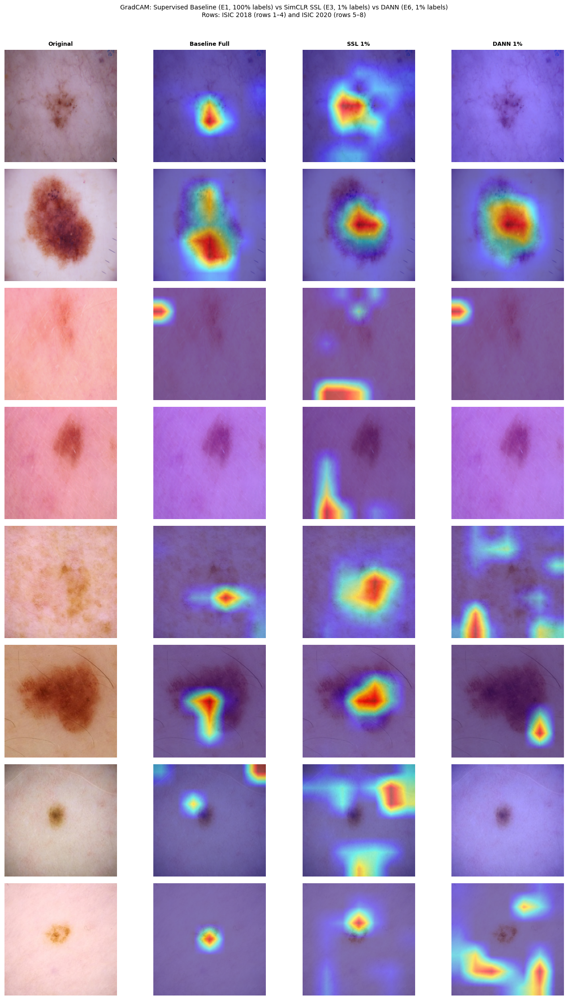

In [11]:
# ── Figure 1: Full grid (8×4) ──
fig1_methods = ['Baseline Full', 'SSL 1%', 'DANN 1%']

fig1 = make_gradcam_grid(
    results,
    col_methods=fig1_methods,
    save_path=FIG_DIR / 'gradcam_fig1_full_vs_ssl_vs_dann.png',
    figsize=(14, 22),
    suptitle=(
        'GradCAM: Supervised Baseline (E1, 100% labels) vs SimCLR SSL (E3, 1% labels) vs DANN (E6, 1% labels)\n'
        'Rows: ISIC 2018 (rows 1–4) and ISIC 2020 (rows 5–8)'
    ),
)


Saved: results/figures/gradcam/gradcam_fig1_compact.png


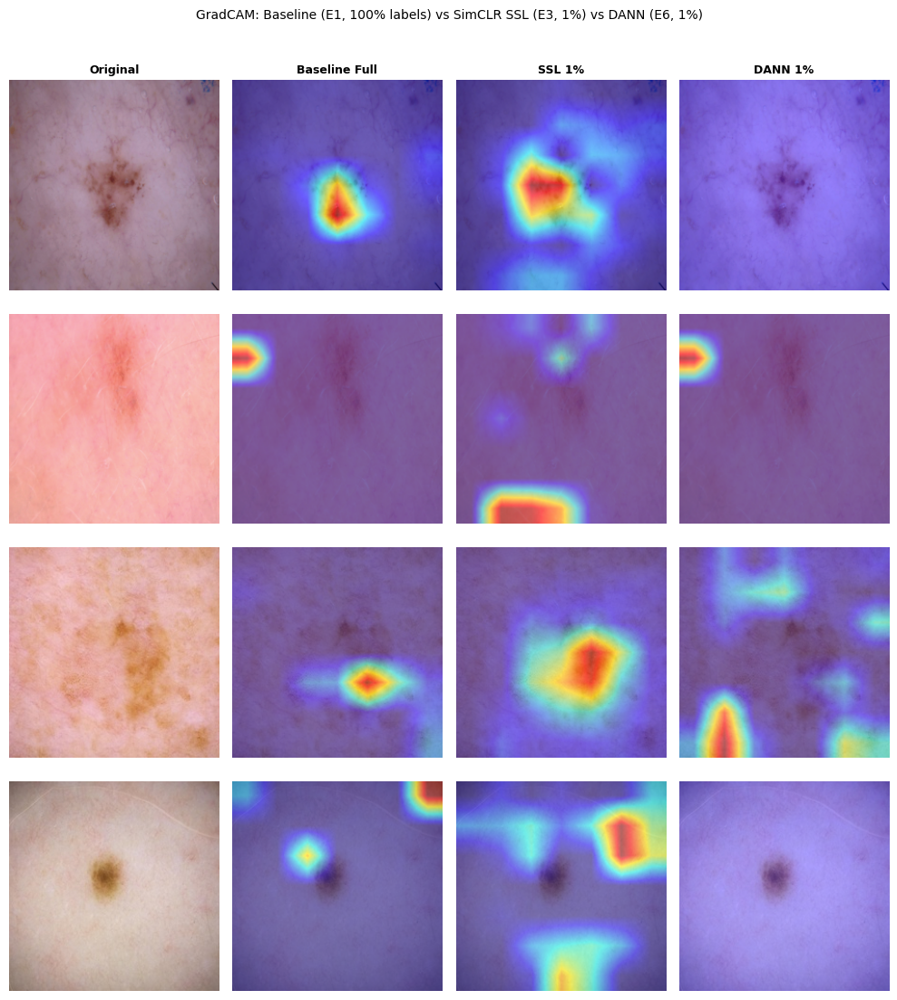

In [12]:
# ── Figure 1 Compact: report-ready (4×4) ──
# Select 1 MEL + 1 BEN per dataset
compact_indices = [
    next(i for i, r in enumerate(results) if r['source'] == 'isic2018' and r['target'] == 1),
    next(i for i, r in enumerate(results) if r['source'] == 'isic2018' and r['target'] == 0),
    next(i for i, r in enumerate(results) if r['source'] == 'isic2020' and r['target'] == 1),
    next(i for i, r in enumerate(results) if r['source'] == 'isic2020' and r['target'] == 0),
]
compact_results = [results[i] for i in compact_indices]

fig1_compact = make_gradcam_grid(
    compact_results,
    col_methods=fig1_methods,
    save_path=FIG_DIR / 'gradcam_fig1_compact.png',
    figsize=(10, 11),
    suptitle='GradCAM: Baseline (E1, 100% labels) vs SimCLR SSL (E3, 1%) vs DANN (E6, 1%)',
)


## 5. Figure export — Baseline 1% vs SSL 1% vs DANN 1%

Same-budget comparison at 1% labels: supervised baseline collapses, SSL recovers, DANN also struggles.
Layout: [Original | Baseline 1% | SSL 1% | DANN 1%]

Saved: results/figures/gradcam/gradcam_fig2_baseline1pct_vs_ssl_vs_dann.png


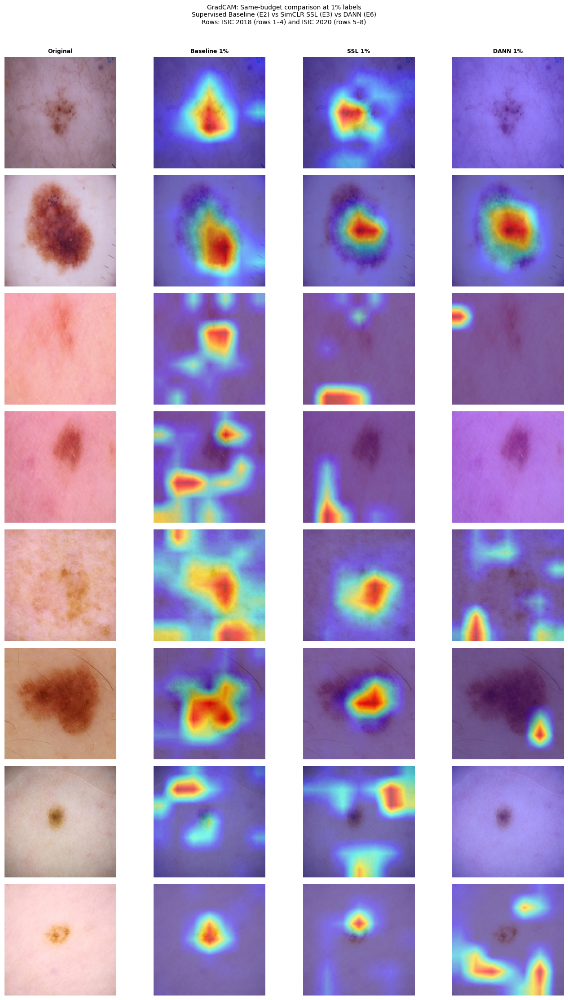

In [13]:
# ── Figure 2: Full grid (8×4) ──
fig2_methods = ['Baseline 1%', 'SSL 1%', 'DANN 1%']

# Only generate if 'Baseline 1%' model is available
if 'Baseline 1%' in models:
    fig2 = make_gradcam_grid(
        results,
        col_methods=fig2_methods,
        save_path=FIG_DIR / 'gradcam_fig2_baseline1pct_vs_ssl_vs_dann.png',
        figsize=(14, 22),
        suptitle=(
            'GradCAM: Same-budget comparison at 1% labels\n'
            'Supervised Baseline (E2) vs SimCLR SSL (E3) vs DANN (E6)\n'
            'Rows: ISIC 2018 (rows 1–4) and ISIC 2020 (rows 5–8)'
        ),
    )
else:
    print('Skipping Figure 2 full grid: Baseline 1% model not loaded')


Saved: results/figures/gradcam/gradcam_fig2_compact.png


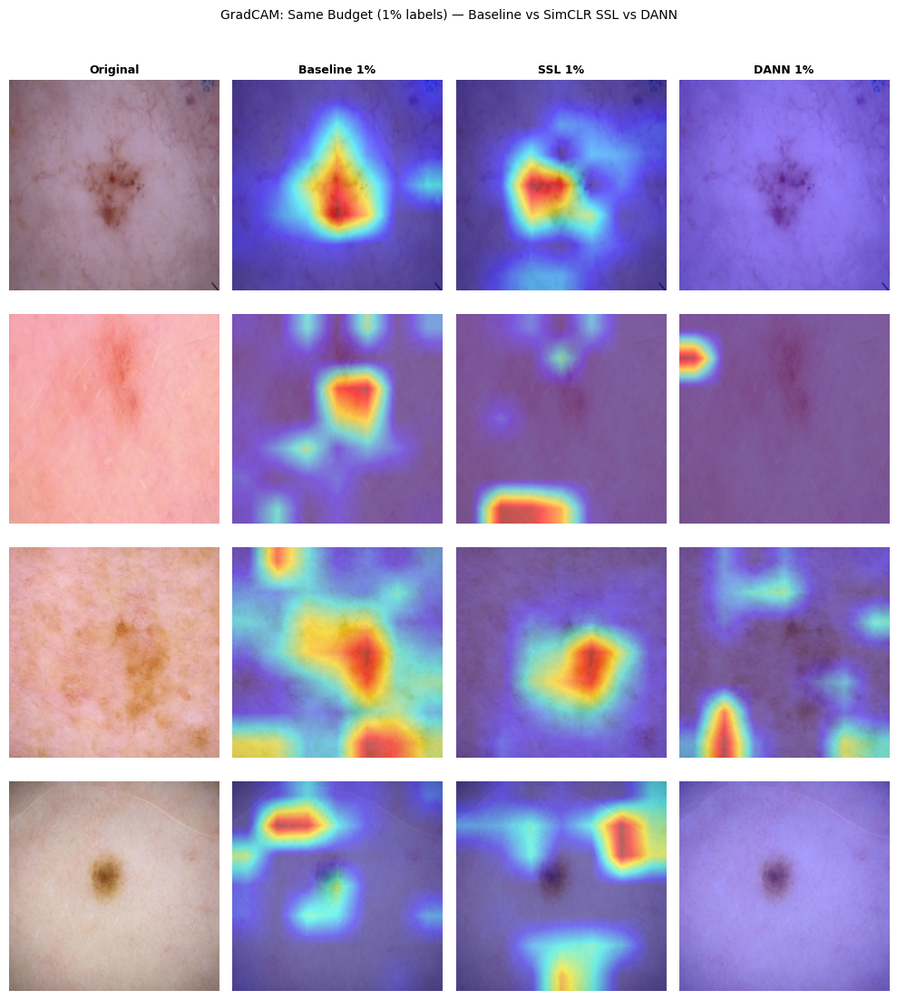

In [14]:
# ── Figure 2 Compact: report-ready (4×4) ──
if 'Baseline 1%' in models:
    fig2_compact = make_gradcam_grid(
        compact_results,
        col_methods=fig2_methods,
        save_path=FIG_DIR / 'gradcam_fig2_compact.png',
        figsize=(10, 11),
        suptitle='GradCAM: Same Budget (1% labels) — Baseline vs SimCLR SSL vs DANN',
    )
else:
    print('Skipping Figure 2 compact: Baseline 1% model not loaded')


## 6. Diagnostic — confidence scores

In [ ]:
# ── Summary confidence scores table ──
loaded_labels = [l for l in model_labels_to_compare if l in models]

print('=== GradCAM Diagnostic Summary ===')
header = f"{'Image':<20} {'Source':<8} {'GT':<5}"
for lbl in loaded_labels:
    header += f" {lbl+' p':<12}"
print(header)
print('-' * (20 + 8 + 5 + 13 * len(loaded_labels)))

for r in results:
    parts = [r['image_id'][:18], r['source'], str(r['target'])]
    for lbl in loaded_labels:
        prob_key = f'prob_{lbl}'
        if prob_key in r:
            parts.append(f"{r[prob_key]:.4f}    ")
        else:
            parts.append('N/A        ')
    print(' '.join(parts))

# ── Verify saved figures ──
print('\n=== Saved figures ===')
for f in sorted(FIG_DIR.glob('*.png')):
    size_kb = f.stat().st_size / 1024
    print(f'  {f.name}  ({size_kb:.0f} KB)')

if len(list(FIG_DIR.glob('*.png'))) == 0:
    print('  (No figures saved yet — run figure cells above)')


=== GradCAM Diagnostic Summary ===
Image                Source   GT    Baseline Full p Baseline 1% p SSL 1% p     DANN 1% p   
-------------------------------------------------------------------------------------
ISIC_0025409 isic2018 1 0.6048     0.5936     0.5340     0.1698    
ISIC_0027089 isic2018 1 0.8392     0.6738     0.6817     0.7217    
ISIC_0027979 isic2018 0 0.0280     0.5051     0.4509     0.1152    
ISIC_0027309 isic2018 0 0.0114     0.5174     0.4075     0.0335    
ISIC_9022005 isic2020 1 0.3135     0.6573     0.6383     0.3588    
ISIC_8040024 isic2020 1 0.0954     0.5866     0.5753     0.1805    
ISIC_8501844 isic2020 0 0.1464     0.5079     0.4514     0.1253    
ISIC_6003494 isic2020 0 0.1995     0.5270     0.4477     0.3720    

=== Saved figures ===
  gradcam_fig1_compact.png  (2593 KB)
  gradcam_fig1_full_vs_ssl_vs_dann.png  (5620 KB)
  gradcam_fig2_baseline1pct_vs_ssl_vs_dann.png  (6029 KB)
  gradcam_fig2_compact.png  (2780 KB)


## 7. SSL label budget progression — GradCAM evolution from 1% to 100%

Shows how SimCLR attention maps improve as the fine-tuning label budget increases.
Same 4 compact images, SSL checkpoints at 6 fractions (0.01 → 1.00).

In [16]:
# ── Load all SSL fractions ──
SSL_FRACTIONS = [0.01, 0.05, 0.10, 0.25, 0.50, 1.00]
ssl_models = {}

for frac in SSL_FRACTIONS:
    exp_name = f'simclr_ft_{frac:.2f}'
    try:
        ssl_models[f'SSL {frac*100:.0f}%'] = load_model(exp_name, device)
    except FileNotFoundError as e:
        print(f'  SKIP: {exp_name} — {e}')

print(f'\nLoaded {len(ssl_models)} SSL checkpoints: {list(ssl_models.keys())}')


  ✓ Loaded: results/runs/simclr_ft_0.01/20260601_143001/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_0.05/20260601_153436/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_0.10/20260601_164605/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_0.25/20260601_170726/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_0.50/20260601_172936/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_1.00/20260602_020334/checkpoints/best.pt

Loaded 6 SSL checkpoints: ['SSL 1%', 'SSL 5%', 'SSL 10%', 'SSL 25%', 'SSL 50%', 'SSL 100%']


In [17]:
# ── Generate GradCAM for SSL progression on compact images ──
ssl_prog_results = []
ssl_labels = list(ssl_models.keys())

# Reconstruct image data for compact images (need tensor + rgb_float)
compact_images_data = []
for r in compact_results:
    # Find matching entry in images_data by image_id
    match = next(img for img in images_data if img['image_id'] == r['image_id'])
    compact_images_data.append(match)

for img_data in compact_images_data:
    entry = {
        'rgb_float': img_data['rgb_float'],
        'target': img_data['target'],
        'source': img_data['source'],
        'image_id': img_data['image_id'],
    }
    for label in ssl_labels:
        cam_img, prob, _ = get_gradcam(
            ssl_models[label], img_data['tensor'], img_data['rgb_float'], device
        )
        entry[f'cam_{label}'] = cam_img
        entry[f'prob_{label}'] = prob
    
    ssl_prog_results.append(entry)
    domain = '2018' if img_data['source'] == 'isic2018' else '2020'
    cls = 'MEL' if img_data['target'] == 1 else 'BEN'
    probs_str = ' | '.join([f'{label}={entry[f"prob_{label}"]:.3f}' for label in ssl_labels])
    print(f'  [{img_data["image_id"][:16]}] {domain} {cls}  {probs_str}')

print(f'\nDone. SSL progression GradCAM for {len(ssl_prog_results)} images × {len(ssl_labels)} fractions.')


  [ISIC_0025409] 2018 MEL  SSL 1%=0.534 | SSL 5%=0.541 | SSL 10%=0.599 | SSL 25%=0.543 | SSL 50%=0.615 | SSL 100%=0.692
  [ISIC_0027979] 2018 BEN  SSL 1%=0.451 | SSL 5%=0.211 | SSL 10%=0.201 | SSL 25%=0.068 | SSL 50%=0.100 | SSL 100%=0.002
  [ISIC_9022005] 2020 MEL  SSL 1%=0.638 | SSL 5%=0.626 | SSL 10%=0.601 | SSL 25%=0.584 | SSL 50%=0.537 | SSL 100%=0.373
  [ISIC_8501844] 2020 BEN  SSL 1%=0.451 | SSL 5%=0.394 | SSL 10%=0.360 | SSL 25%=0.534 | SSL 50%=0.455 | SSL 100%=0.165

Done. SSL progression GradCAM for 4 images × 6 fractions.


Saved: results/figures/gradcam/gradcam_fig3_ssl_progression.png


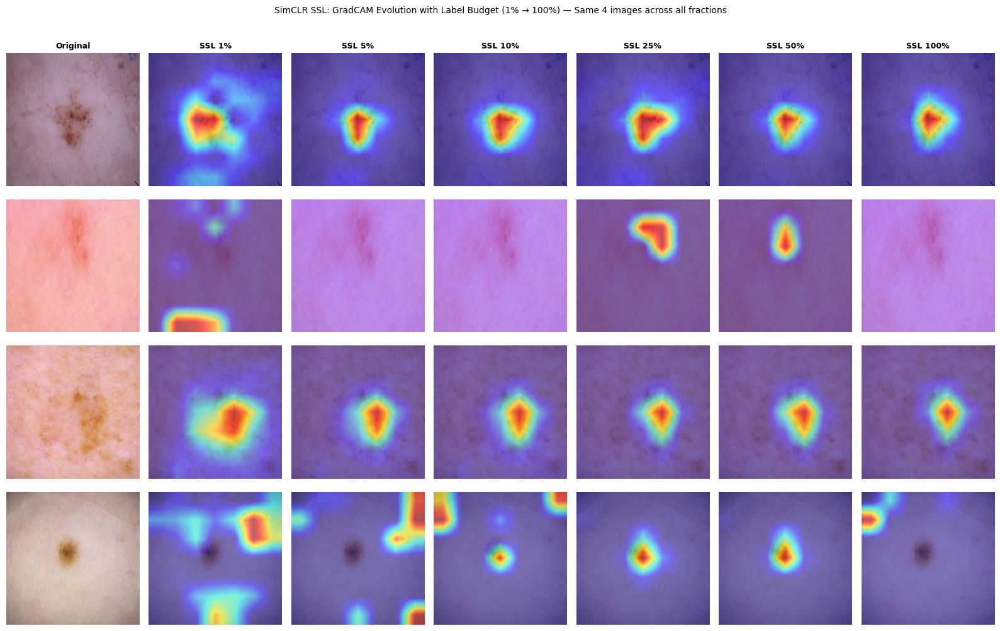

In [18]:
# ── Figure 3: SSL budget progression (4×7 grid) ──
fig3 = make_gradcam_grid(
    ssl_prog_results,
    col_methods=ssl_labels,
    save_path=FIG_DIR / 'gradcam_fig3_ssl_progression.png',
    figsize=(16, 10),
    suptitle='SimCLR SSL: GradCAM Evolution with Label Budget (1% → 100%) — Same 4 images across all fractions',
)


## 8. All methods at full budget — GradCAM comparison (100% labels)

Compares all 5 methods at maximum label budget (100% labels):
Baseline Full, SimCLR Full, Mean Teacher Full, Pseudo-label Full, DANN Full.
Both successful methods (Baseline, SSL) and failure cases (MT, Pseudo, DANN) at 100% budget.

In [19]:
# ── Load all methods at full budget ──
FULL_METHODS = [
    ('baseline_resnet18_full',  'Baseline Full'),
    ('simclr_ft_1.00',          'SSL Full'),
    ('mean_teacher_ft_1.00',    'Mean Teacher Full'),
    ('pseudo_label_ft_1.00',    'Pseudo-label Full'),
    ('dann_ft_1.00',            'DANN Full'),
]

full_models = {}
for exp_name, label in FULL_METHODS:
    try:
        full_models[label] = load_model(exp_name, device)
    except FileNotFoundError as e:
        print(f'  SKIP: {label} — {e}')

print(f'\nLoaded {len(full_models)} full-budget models: {list(full_models.keys())}')


  ✓ Loaded: results/runs/baseline_resnet18_full/20260530_140056/checkpoints/best.pt
  ✓ Loaded: results/runs/simclr_ft_1.00/20260602_020334/checkpoints/best.pt
  ✓ Loaded: results/runs/mean_teacher_ft_1.00/20260604_014122/checkpoints/best.pt
  ✓ Loaded: results/runs/pseudo_label_ft_1.00/20260603_040133/checkpoints/best.pt
  ✓ Loaded: results/runs/dann_ft_1.00/20260605_035302/checkpoints/best.pt

Loaded 5 full-budget models: ['Baseline Full', 'SSL Full', 'Mean Teacher Full', 'Pseudo-label Full', 'DANN Full']


In [20]:
# ── Generate GradCAM for all methods at full budget ──
full_results = []
full_labels = list(full_models.keys())

for img_data in compact_images_data:
    entry = {
        'rgb_float': img_data['rgb_float'],
        'target': img_data['target'],
        'source': img_data['source'],
        'image_id': img_data['image_id'],
    }
    for label in full_labels:
        cam_img, prob, _ = get_gradcam(
            full_models[label], img_data['tensor'], img_data['rgb_float'], device
        )
        entry[f'cam_{label}'] = cam_img
        entry[f'prob_{label}'] = prob
    
    full_results.append(entry)
    domain = '2018' if img_data['source'] == 'isic2018' else '2020'
    cls = 'MEL' if img_data['target'] == 1 else 'BEN'
    probs_str = ' | '.join([f'{label}={entry[f"prob_{label}"]:.3f}' for label in full_labels])
    print(f'  [{img_data["image_id"][:16]}] {domain} {cls}  {probs_str}')

print(f'\nDone. All-methods full-budget GradCAM for {len(full_results)} images × {len(full_labels)} methods.')


  [ISIC_0025409] 2018 MEL  Baseline Full=0.605 | SSL Full=0.692 | Mean Teacher Full=0.613 | Pseudo-label Full=0.536 | DANN Full=0.365
  [ISIC_0027979] 2018 BEN  Baseline Full=0.028 | SSL Full=0.002 | Mean Teacher Full=0.031 | Pseudo-label Full=0.001 | DANN Full=0.077
  [ISIC_9022005] 2020 MEL  Baseline Full=0.314 | SSL Full=0.373 | Mean Teacher Full=0.678 | Pseudo-label Full=0.104 | DANN Full=0.654
  [ISIC_8501844] 2020 BEN  Baseline Full=0.146 | SSL Full=0.165 | Mean Teacher Full=0.374 | Pseudo-label Full=0.041 | DANN Full=0.137

Done. All-methods full-budget GradCAM for 4 images × 5 methods.


Saved: results/figures/gradcam/gradcam_fig4_all_methods_full_budget.png


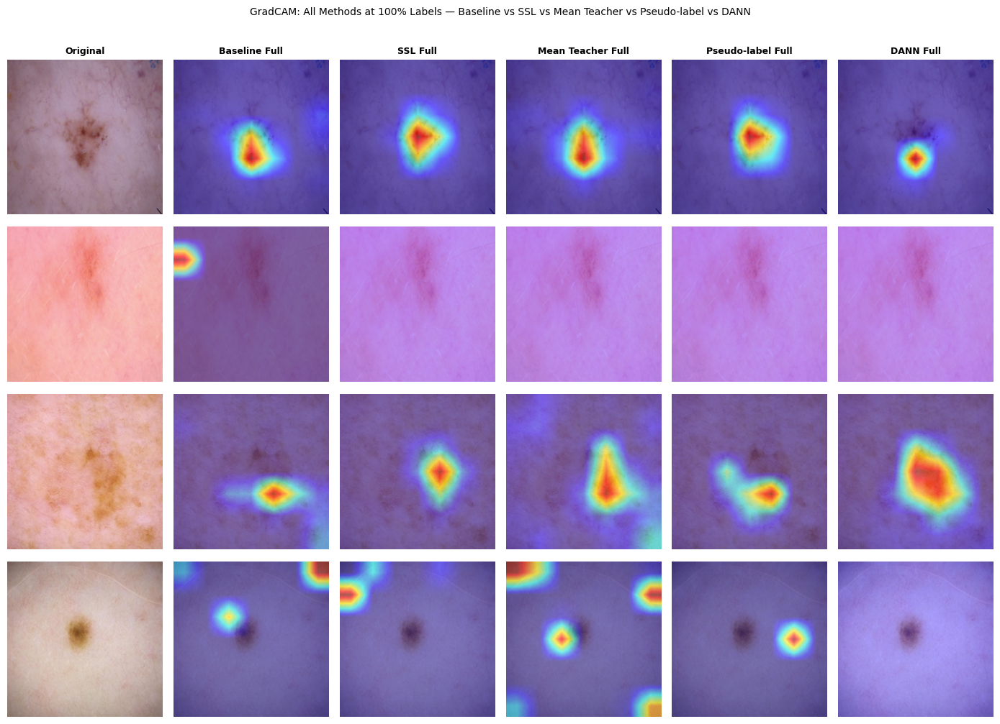

In [21]:
# ── Figure 4: All methods full budget (4×6 grid) ──
fig4 = make_gradcam_grid(
    full_results,
    col_methods=full_labels,
    save_path=FIG_DIR / 'gradcam_fig4_all_methods_full_budget.png',
    figsize=(14, 10),
    suptitle='GradCAM: All Methods at 100% Labels — Baseline vs SSL vs Mean Teacher vs Pseudo-label vs DANN',
)


## 9. Mean Teacher collapse — 1% vs 100% labels

Mean Teacher fails catastrophically at 1% labels (AUC 0.55 target — near random).
This figure shows the GradCAM evidence of the collapse: MT 1% produces flat/noisy attention maps
compared to MT 100%. SSL 1% included as reference for a successful low-label method.

In [22]:
# ── Load Mean Teacher at 1% and 100% ──
MT_METHODS = [
    ('mean_teacher_ft_0.01', 'MT 1%'),
    ('mean_teacher_ft_1.00', 'MT 100%'),
]

mt_models = {}
for exp_name, label in MT_METHODS:
    try:
        mt_models[label] = load_model(exp_name, device)
    except FileNotFoundError as e:
        print(f'  SKIP: {label} — {e}')

print(f'\nLoaded {len(mt_models)} MT models: {list(mt_models.keys())}')


  ✓ Loaded: results/runs/mean_teacher_ft_0.01/20260603_131816/checkpoints/best.pt
  ✓ Loaded: results/runs/mean_teacher_ft_1.00/20260604_014122/checkpoints/best.pt

Loaded 2 MT models: ['MT 1%', 'MT 100%']


In [23]:
# ── Generate GradCAM for MT collapse analysis ──
mt_results = []
mt_labels = list(mt_models.keys())

# Also add SSL 1% as reference (already loaded in the main models dict)
ssl_1pct_ref_label = 'SSL 1% (ref)'
ref_models = {}
if 'SSL 1%' in models:
    ref_models[ssl_1pct_ref_label] = models['SSL 1%']

all_mt_labels = mt_labels + [ssl_1pct_ref_label] if ref_models else mt_labels

for img_data in compact_images_data:
    entry = {
        'rgb_float': img_data['rgb_float'],
        'target': img_data['target'],
        'source': img_data['source'],
        'image_id': img_data['image_id'],
    }
    for label, model in {**mt_models, **ref_models}.items():
        cam_img, prob, _ = get_gradcam(model, img_data['tensor'], img_data['rgb_float'], device)
        entry[f'cam_{label}'] = cam_img
        entry[f'prob_{label}'] = prob
    
    mt_results.append(entry)
    domain = '2018' if img_data['source'] == 'isic2018' else '2020'
    cls = 'MEL' if img_data['target'] == 1 else 'BEN'
    probs_str = ' | '.join([f'{l}={entry[f"prob_{l}"]:.3f}' for l in all_mt_labels])
    print(f'  [{img_data["image_id"][:16]}] {domain} {cls}  {probs_str}')

print(f'\nDone. MT collapse analysis GradCAM for {len(mt_results)} images × {len(all_mt_labels)} checkpoints.')


  [ISIC_0025409] 2018 MEL  MT 1%=0.455 | MT 100%=0.613 | SSL 1% (ref)=0.534
  [ISIC_0027979] 2018 BEN  MT 1%=0.485 | MT 100%=0.031 | SSL 1% (ref)=0.451
  [ISIC_9022005] 2020 MEL  MT 1%=0.521 | MT 100%=0.678 | SSL 1% (ref)=0.638
  [ISIC_8501844] 2020 BEN  MT 1%=0.474 | MT 100%=0.374 | SSL 1% (ref)=0.451

Done. MT collapse analysis GradCAM for 4 images × 3 checkpoints.


Saved: results/figures/gradcam/gradcam_fig5_mt_collapse_1pct.png


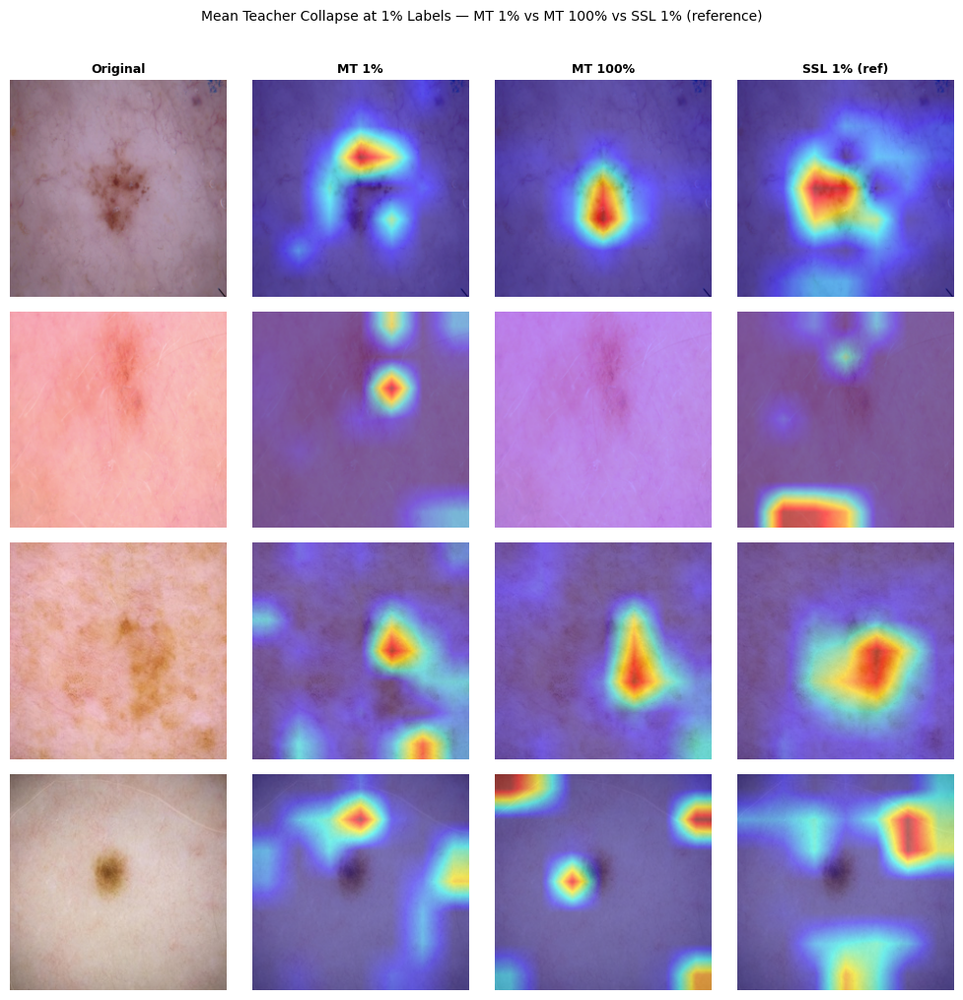

In [24]:
# ── Figure 5: MT collapse (4×4 grid) ──
fig5 = make_gradcam_grid(
    mt_results,
    col_methods=all_mt_labels,
    save_path=FIG_DIR / 'gradcam_fig5_mt_collapse_1pct.png',
    figsize=(10, 10),
    suptitle='Mean Teacher Collapse at 1% Labels — MT 1% vs MT 100% vs SSL 1% (reference)',
)
